# **ASL Alphabets Classification**

Training multiple Classifiers on 26 Alphabets pictures and 2 words SPACE, and DELETE. For now, the model is being trained only on alphabets mostly but later using this same approach we can train on words. After training, the best model will be used to actually predict on a real person signing alphabets. 

## **Our Approach**

- Acquire a Dataset of images signing alphabets.
- Perform Hand Landmarking on each video and we get angles data from the landmarks.
- Select only the relevant and important angles.
- Train different models such as Random Forest, KNN, Decision Tree.
- Evaluate the models and see which one is performing the best.

### **Step 1: Loading the dataset and reading the images**

Dataset is basically images of a person signing Alphabets and two words Space, Del. 

In [1]:
import cv2
import os

In [31]:
# Define the path to your ASL dataset
base_path = 'dataset/'

# List of ASL categories
asl_categories = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'del', 'space']

# Desired number of images per class
# images_per_class = 10

### **Step 2: Performing Pose Estimation and extracting angles from the videos**

In [5]:
%pip install mediapipe==0.10.1

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


**NOTE:** You only need to do this once, if you do not have hand_landmarker.task. If you have this file, then simply place in the PythonI folder -> Lib folder -> site-packages folder. The path for me was D:/Software/PythonI/Lib/site-packages/ . After downloading, I simply place this file "hand_landmarker.task" in the folder on this path.

In [6]:
!curl -o hand_landmarker.task https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
 34 7635k   34 2671k    0     0  2242k      0  0:00:03  0:00:01  0:00:02 2247k
 62 7635k   62 4735k    0     0  2221k      0  0:00:03  0:00:02  0:00:01 2224k
 83 7635k   83 6367k    0     0  2015k      0  0:00:03  0:00:03 --:--:-- 2017k
100 7635k  100 7635k    0     0  2092k      0  0:00:03  0:00:03 --:--:-- 2093k


In [7]:
import math

def get_angle(point1, point2, point3):
    """ Calculate angle between two lines """
    if(point1==(0,0) or point2==(0,0) or point3==(0,0)):
        return 0
    numerator = point2[1] * (point1[0] - point3[0]) + point1[1] * \
                (point3[0] - point2[0]) + point3[1] * (point2[0] - point1[0])
    denominator = (point2[0] - point1[0]) * (point1[0] - point3[0]) + \
                (point2[1] - point1[1]) * (point1[1] - point3[1])

    try:
        ang = math.atan(numerator/denominator)

        ang = ang * 180 / math.pi
        if ang < 0:
            ang = 180 + ang
        return ang
    except:
        return 90.0

In [51]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from mediapipe.framework.formats import landmark_pb2
import numpy as np
import os

# Function to perform pose estimation and get angles for images
def get_angles_data(base_path, categories):

    # Create a HandLandmarker object.
    base_options = python.BaseOptions(model_asset_path='hand_landmarker.task')
    options = vision.HandLandmarkerOptions(base_options=base_options, num_hands=2)
    detector = vision.HandLandmarker.create_from_options(options)

    angles_data = {}

    for category in categories:
        category_path = os.path.join(base_path, category)
        category_angles = {}

        image_num = 0

        for image_file in os.listdir(category_path):
            image_path = os.path.join(category_path, image_file)

            # Create mp.Image from file
            image = mp.Image.create_from_file(image_path)

            # Process image
            results = detector.detect(image)

            hand_landmarks_list = results.hand_landmarks

            if hand_landmarks_list:
                # Your existing code for extracting angles
                image_landmarks = {}
                for idx in range(len(hand_landmarks_list)):
                    hand_landmarks = hand_landmarks_list[idx]

                    hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
                    hand_landmarks_proto.landmark.extend([
                        landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
                    ])

                    for i, data_point in enumerate(hand_landmarks_proto.landmark):
                        image_landmarks[i] = (data_point.x, data_point.y)
                
                
                # These angles are calculated between two lines. The lines will have a landmark in common. 
                # These landmarks can be seen from the hand_landmarks.png image.
                # Getting angle between the two lines
                angle0 = get_angle(image_landmarks[4], image_landmarks[3], image_landmarks[2])
                angle1 = get_angle(image_landmarks[3], image_landmarks[2], image_landmarks[1])
                angle2 = get_angle(image_landmarks[2], image_landmarks[1], image_landmarks[0])
                angle3 = get_angle(image_landmarks[1], image_landmarks[0], image_landmarks[5])
                angle4 = get_angle(image_landmarks[8], image_landmarks[7], image_landmarks[6])
                angle5 = get_angle(image_landmarks[7], image_landmarks[6], image_landmarks[5])
                angle6 = get_angle(image_landmarks[6], image_landmarks[5], image_landmarks[0])
                angle7 = get_angle(image_landmarks[12], image_landmarks[11], image_landmarks[10])
                angle8 = get_angle(image_landmarks[11], image_landmarks[10], image_landmarks[9])
                angle9 = get_angle(image_landmarks[10], image_landmarks[9], image_landmarks[13])
                angle10 = get_angle(image_landmarks[16], image_landmarks[15], image_landmarks[14])
                angle11 = get_angle(image_landmarks[15], image_landmarks[14], image_landmarks[13])
                angle12 = get_angle(image_landmarks[14], image_landmarks[13], image_landmarks[17])
                angle13 = get_angle(image_landmarks[20], image_landmarks[19], image_landmarks[18])
                angle14 = get_angle(image_landmarks[19], image_landmarks[18], image_landmarks[17])
                angle15 = get_angle(image_landmarks[18], image_landmarks[17], image_landmarks[0])


                # Adding angles to the dictionary
                category_angles[image_num] = [angle0, angle1, angle2, angle3, angle4, angle5, angle6, angle7, angle8, angle9,
                                            angle10, angle11, angle12, angle13, angle14, angle15]
                
                image_num += 1

        angles_data[category] = category_angles

    return angles_data


In [52]:
angles_data = get_angles_data(base_path, asl_categories)

In [53]:
print(angles_data)

{'A': {0: [174.81846689936742, 164.1989324251141, 163.17384212164978, 60.54318082194743, 179.40124129856224, 26.216870523134336, 164.61743936192664, 3.9752702352684284, 25.83289682943683, 151.288780446141, 5.7091681268178265, 27.468977954555697, 168.05036900595366, 5.785881521418423, 30.50435222751321, 89.86574883140965], 1: [173.58072987323752, 165.5976670054454, 163.18912518732736, 58.03769002361242, 179.46131588621947, 43.844519106525155, 158.09546101684256, 4.116600218931254, 25.451611775595282, 147.38296739285218, 5.893008917518903, 27.54103637489727, 156.4651922985783, 4.945966706227385, 31.485257979648196, 67.83405888173911], 2: [173.6454306127585, 165.4534883158751, 163.04219356685772, 59.767679808598935, 179.4475308650235, 23.748069006660213, 163.96751365085586, 3.599974407458066, 27.727620649885967, 150.22780843408827, 5.552419751222688, 27.427891631782714, 163.81345067050293, 5.5260597196539445, 31.062672965697665, 82.17634151282334], 3: [173.86328864438025, 164.572026648463

### **Step 3: Data Preprocessing**

#### Creating a Dataframe from the angles data

In [54]:
%pip install pandas

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [55]:
import pandas as pd

# Create a list to store the data
data_list = []

# Iterate through each category
for category, images in angles_data.items():
    # Iterate through each image
    for image_num, angles in images.items():
        # Append category and angles to the data list
        data_list.append(angles + [category])

# Create column names
columns = [f'Angle{i}' for i in range(16)] + ['Category']

# Create a DataFrame
df = pd.DataFrame(data_list, columns=columns)

# Display the DataFrame
print(df)


           Angle0      Angle1      Angle2      Angle3      Angle4     Angle5  \
0      174.818467  164.198932  163.173842   60.543181  179.401241  26.216871   
1      173.580730  165.597667  163.189125   58.037690  179.461316  43.844519   
2      173.645431  165.453488  163.042194   59.767680  179.447531  23.748069   
3      173.863289  164.572027  163.623004   59.483302    0.288612  22.236741   
4      171.184144  164.768301  164.587197   58.574835    0.655507  82.419550   
...           ...         ...         ...         ...         ...        ...   
49468  173.576168  175.898740  154.756791  112.566536    3.990829  25.913677   
49469  175.061428  171.290105  156.753026  114.551343    0.885944  10.845170   
49470  173.217120  176.910663  156.606275  104.968791    6.785274  30.877703   
49471  172.580484  179.064718  157.910004  100.114805    7.532450  45.049443   
49472  174.677831  179.971279  154.763866  101.057086    7.887727  38.104684   

           Angle6     Angle7     Angle8

In [56]:
%pip install seaborn matplotlib

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


#### Mapping the ShotType Column to numerical values

In [57]:
# Mapping for ASL categories
asl_category_mapping = {'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'Z': 25, 'del': 26, 'space': 27}

# Apply mapping to 'Category' column
df['Category'] = df['Category'].map(asl_category_mapping)

# Display the updated DataFrame
print(df)

           Angle0      Angle1      Angle2      Angle3      Angle4     Angle5  \
0      174.818467  164.198932  163.173842   60.543181  179.401241  26.216871   
1      173.580730  165.597667  163.189125   58.037690  179.461316  43.844519   
2      173.645431  165.453488  163.042194   59.767680  179.447531  23.748069   
3      173.863289  164.572027  163.623004   59.483302    0.288612  22.236741   
4      171.184144  164.768301  164.587197   58.574835    0.655507  82.419550   
...           ...         ...         ...         ...         ...        ...   
49468  173.576168  175.898740  154.756791  112.566536    3.990829  25.913677   
49469  175.061428  171.290105  156.753026  114.551343    0.885944  10.845170   
49470  173.217120  176.910663  156.606275  104.968791    6.785274  30.877703   
49471  172.580484  179.064718  157.910004  100.114805    7.532450  45.049443   
49472  174.677831  179.971279  154.763866  101.057086    7.887727  38.104684   

           Angle6     Angle7     Angle8

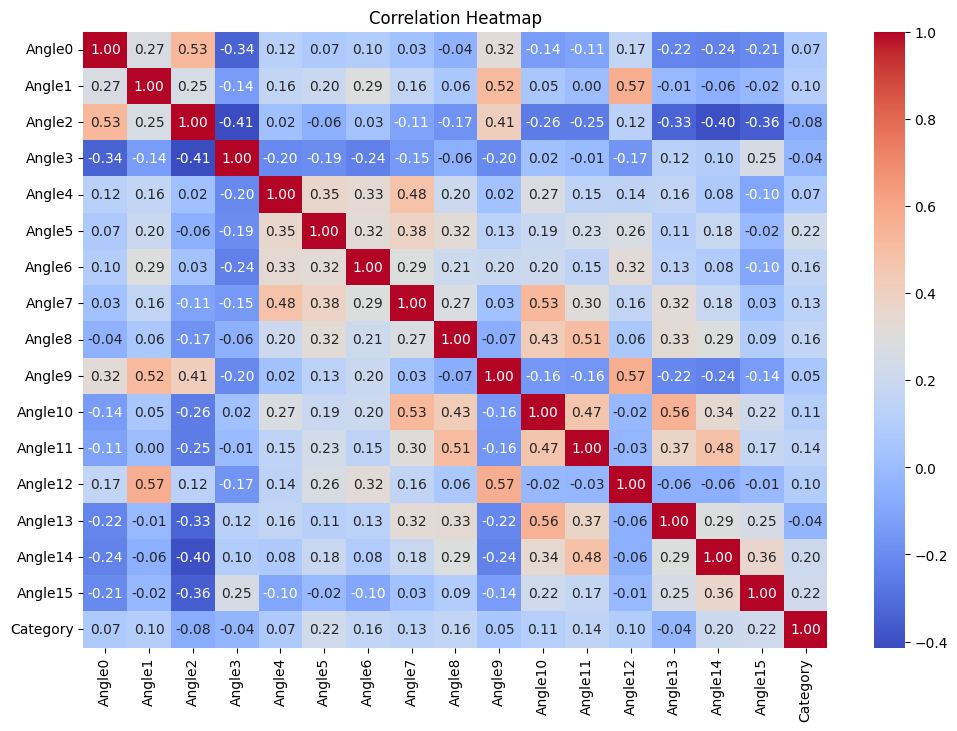

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# If you have a correlation matrix, you can directly use sns.heatmap(corr_matrix)
# Otherwise, you can use the pairplot function for a general overview

# Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Pairplot
# If your DataFrame is too large, consider using a subset for better visualization
# sns.pairplot(df.sample(n=1000), hue='Category', markers='.', height=2)
# Adjust the sample size based on your DataFrame size

plt.show()


This above heatmap is basically showing that the features i.e., Angle0 ... Angle15, have significance in predicting the label(Category : A-Z, Space, Del). Basically more warm cells shows that the features will surely be able to predict the labels. 

#### Checking for missing values

In [59]:
# Check for missing values
df.isnull().sum()

Angle0      0
Angle1      0
Angle2      0
Angle3      0
Angle4      0
Angle5      0
Angle6      0
Angle7      0
Angle8      0
Angle9      0
Angle10     0
Angle11     0
Angle12     0
Angle13     0
Angle14     0
Angle15     0
Category    0
dtype: int64

If there were any missing values we can impute them with the mean value in that column. 

In [ ]:
# df.fillna(df.mean(), inplace=True)

#### Splitting the data with 80:20 ratio

In [61]:
from sklearn.model_selection import train_test_split

# Separate features (X) and labels (y)
X = df.drop('Category', axis=1)
y = df['Category']

# Split the data into training and testing sets (80:20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of the resulting sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (39578, 16)
X_test shape: (9895, 16)
y_train shape: (39578,)
y_test shape: (9895,)


### **Step 4: Training and Evaluating multiple classifiers**
- Random Forest
- KNN
- Decision Tree

#### 1. Random Forest

In [62]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Train the classifier on the training data
rf_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred_rf = rf_classifier.predict(X_test)

# Evaluate the performance
accuracy_rf = accuracy_score(y_test, y_pred_rf)
classification_report_rf = classification_report(y_test, y_pred_rf)

# Display the results
print("Random Forest Classifier:")
print(f"Accuracy: {accuracy_rf:.2f}")
print("Classification Report:")
print(classification_report_rf)

Random Forest Classifier:
Accuracy: 0.97
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       284
           1       1.00      1.00      1.00       325
           2       0.99      0.95      0.97       308
           3       0.98      0.96      0.97       340
           4       0.98      0.98      0.98       410
           5       0.99      0.97      0.98       320
           6       0.98      0.97      0.98       271
           7       0.97      0.96      0.97       298
           8       0.92      0.93      0.93       379
           9       0.94      0.92      0.93       371
          10       1.00      1.00      1.00       376
          11       0.98      1.00      0.99       358
          12       0.84      0.92      0.88       262
          13       0.90      0.82      0.86       205
          14       0.98      0.98      0.98       371
          15       0.96      0.97      0.97       362
          16     

In [63]:
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


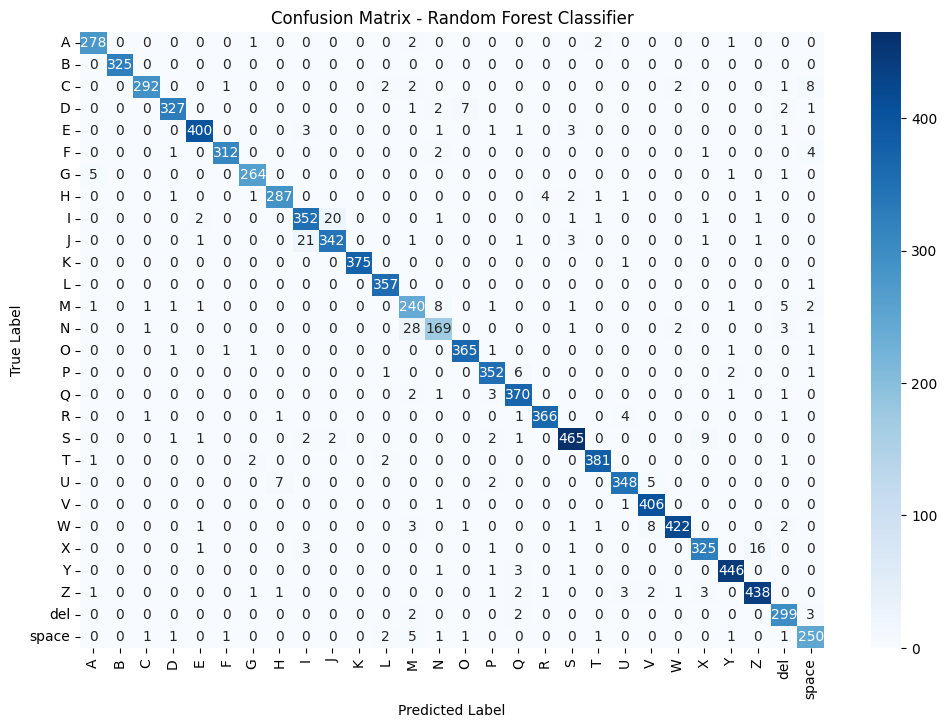

In [64]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the confusion matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Create a heatmap for visualization
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', xticklabels=asl_category_mapping.keys(), yticklabels=asl_category_mapping.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Random Forest Classifier')
plt.show()

#### 2. Decision Tree Classifier

In [65]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Create a Decision Tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Train the classifier on the training data
dt_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred_dt = dt_classifier.predict(X_test)

# Evaluate the performance
accuracy_dt = accuracy_score(y_test, y_pred_dt)
classification_report_dt = classification_report(y_test, y_pred_dt)

# Display the results
print("Decision Tree Classifier:")
print(f"Accuracy: {accuracy_dt:.2f}")
print("Classification Report:")
print(classification_report_dt)


Decision Tree Classifier:
Accuracy: 0.91
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       284
           1       0.99      0.98      0.99       325
           2       0.94      0.93      0.94       308
           3       0.93      0.91      0.92       340
           4       0.95      0.91      0.93       410
           5       0.97      0.94      0.96       320
           6       0.93      0.92      0.93       271
           7       0.85      0.90      0.88       298
           8       0.85      0.80      0.83       379
           9       0.81      0.88      0.84       371
          10       0.96      0.96      0.96       376
          11       0.93      0.98      0.95       358
          12       0.76      0.76      0.76       262
          13       0.83      0.80      0.81       205
          14       0.94      0.96      0.95       371
          15       0.94      0.88      0.91       362
          16     

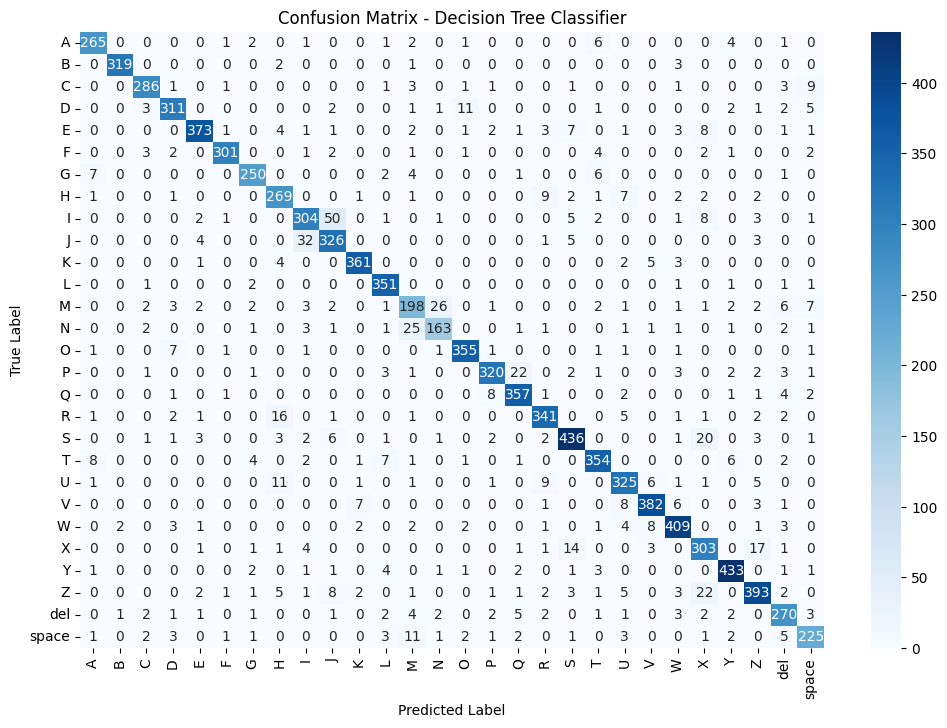

In [66]:
# Generate and display the confusion matrix
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix_dt, annot=True, fmt='d', cmap='Blues', xticklabels=asl_category_mapping.keys(), yticklabels=asl_category_mapping.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Decision Tree Classifier')
plt.show()


#### 3. KNN

In [67]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Create a KNN classifier (you can specify the number of neighbors with the n_neighbors parameter)
knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Train the classifier on the training data
knn_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred_knn = knn_classifier.predict(X_test)

# Evaluate the performance
accuracy_knn = accuracy_score(y_test, y_pred_knn)
classification_report_knn = classification_report(y_test, y_pred_knn)

# Display the results
print("K-Nearest Neighbors (KNN) Classifier:")
print(f"Accuracy: {accuracy_knn:.2f}")
print("Classification Report:")
print(classification_report_knn)

K-Nearest Neighbors (KNN) Classifier:
Accuracy: 0.89
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       284
           1       0.95      0.98      0.97       325
           2       0.97      0.93      0.95       308
           3       0.97      0.89      0.93       340
           4       0.93      0.94      0.93       410
           5       0.98      0.97      0.97       320
           6       0.82      0.87      0.84       271
           7       0.83      0.85      0.84       298
           8       0.79      0.81      0.80       379
           9       0.78      0.79      0.79       371
          10       0.94      0.94      0.94       376
          11       0.89      0.95      0.92       358
          12       0.76      0.71      0.73       262
          13       0.77      0.75      0.76       205
          14       0.94      0.98      0.96       371
          15       0.93      0.93      0.93       362
     

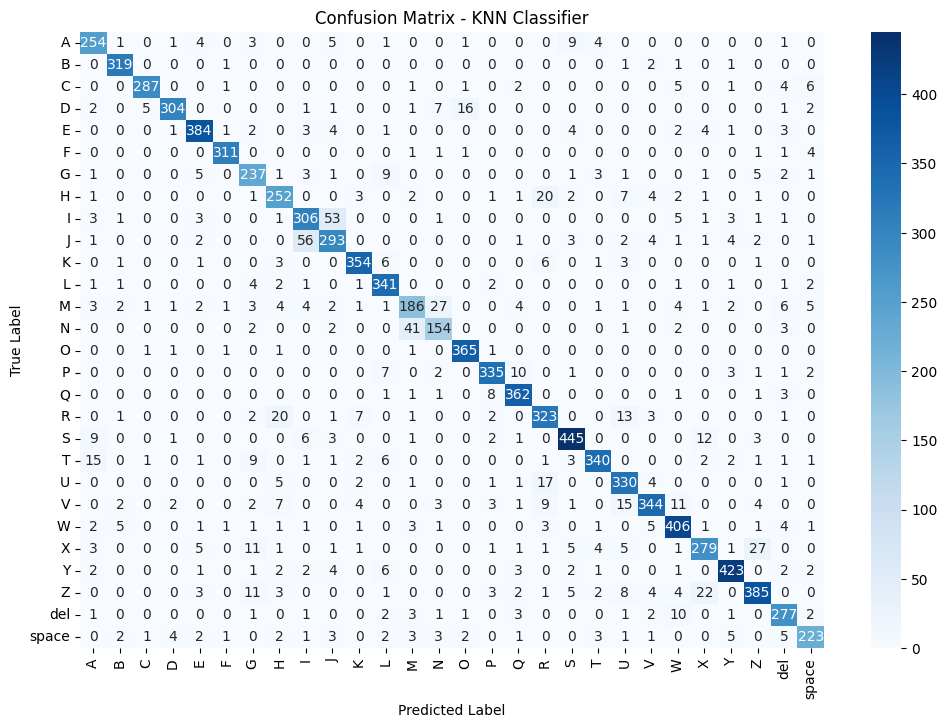

In [68]:
# Generate and display the confusion matrix
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix_knn, annot=True, fmt='d', cmap='Blues', xticklabels=asl_category_mapping.keys(), yticklabels=asl_category_mapping.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - KNN Classifier')
plt.show()

### **Saving all three models' file**

In [70]:
%pip install scikit-learn


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [73]:
from joblib import dump

# Save the model to a file
dump(rf_classifier, 'rf_classifier.pkl')
dump(dt_classifier, 'dt_classifier.pkl')
dump(knn_classifier, 'knn_classifier.pkl')

['knn_classifier.pkl']

The model with the best accuracy and performance can be seen from the above classification reports and the confusion matrix is Random Forest Classifier with the accuracy of 97%. 